<a href="https://colab.research.google.com/github/Ron-Maina/Deep_Convolutional_Neural_Networks_for_Image_Classification/blob/main/Deep_Convolutional_Neural_Networks_for_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Assignment 3: Deep Convolutional Neural Networks and Transformers

# Section 1: Implementation, Analysis, Performance Evaluation and Comparison of Deep Convolutional Neural Networks for Image Classification (70 points)

**Objective:** The objective of this section is to implement a deep convolutional neural network (CNN) for the identification of flower types. The provided dataset consists of five classes of flowers, namely chamomile, tulip, rose, sunflower, and dandelion.

**Tasks:**
To complete this assignment, please submit a single notebook that includes the implementation and outputs of the following eight steps.
Provide answers for each sub-question by thorough analysis and extensive experimental investigation using the provided dataset. In other words, your answers should be backed by experimental analysis of your models and the dataset. Please ensure that the notebook retain the outputs. Failure to do so will result in zero marks for the corresponding steps in which no output is displayed.

**1. Prepare and Preprocess the data. (10 points)**

* What is the total number of images in the dataset, and how are they distributed across the five flower types?

* Do we need to implement techniques to balance the distribution of images across various flower types, such as oversampling or undersampling?

* What are the dimensions (height and width) of the images in the dataset, and is there any variation among different flower types?

* What preprocessing techniques should be applied, such as resizing, normalization or standardization and why?

* How would you split the dataset into training, validation and testing sets, and in what ratios?


In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras import regularizers
import seaborn as sns

In [ ]:
!unzip flowers-1.zip

Archive:  flowers-1.zip
   creating: flowers/daisy/
  inflating: flowers/daisy/100080576_f52e8ee070_n.jpg  
  inflating: flowers/daisy/10140303196_b88d3d6cec.jpg  
  inflating: flowers/daisy/10172379554_b296050f82_n.jpg  
  inflating: flowers/daisy/10172567486_2748826a8b.jpg  
  inflating: flowers/daisy/10172636503_21bededa75_n.jpg  
  inflating: flowers/daisy/102841525_bd6628ae3c.jpg  
  inflating: flowers/daisy/10300722094_28fa978807_n.jpg  
  inflating: flowers/daisy/1031799732_e7f4008c03.jpg  
  inflating: flowers/daisy/10391248763_1d16681106_n.jpg  
  inflating: flowers/daisy/10437754174_22ec990b77_m.jpg  
  inflating: flowers/daisy/10437770546_8bb6f7bdd3_m.jpg  
  inflating: flowers/daisy/10437929963_bc13eebe0c.jpg  
  inflating: flowers/daisy/10466290366_cc72e33532.jpg  
  inflating: flowers/daisy/10466558316_a7198b87e2.jpg  
  inflating: flowers/daisy/10555749515_13a12a026e.jpg  
  inflating: flowers/daisy/10555815624_dc211569b0.jpg  
  inflating: flowers/daisy/10555826524_423e

In [ ]:
#Step 1 implementation
#Hint: Take the help of split-folder python library
!pip install split-folders
import splitfolders

splitfolders.ratio('/content/flowers', output="output", seed=1337, ratio=(0.7, 0.2, 0.1))

Copying files: 4317 files [00:02, 2002.55 files/s]


**2. Design a CNN architecture with its input is image size of $224 \times 224 \times 3$ and the output is the class. Draw the diagram of your CNN architecture (An example diagram is given blow) and save it as "studentCNN.png".(5 points)**
  
* Design and Explain why you think this architecture is suitable for this image classification task.
  
<img src='CNN.png' alt='given CNN'>

> **Step 2** Design and draw CNN
>
> **hint** Consider the computational cost of training your CNN
>
> <img src='/content/studentCNN.jpg' alt='student CNN'>

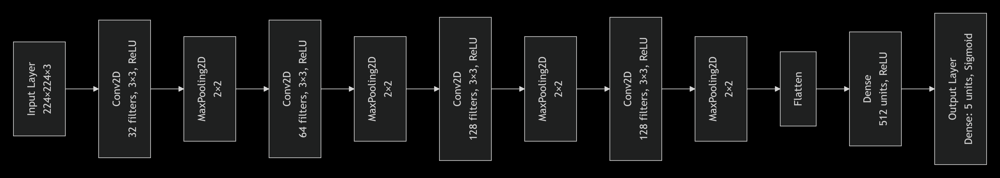

In [ ]:
from IPython.display import Image, display
display(Image('/content/studentCNN.png'))

#### Answer: Why this architecture is suitable for this image classification task?
Convolutional layers extract hierarchical features from simple edges to complex patterns.

MaxPooling layers reduce spatial size, focus on important features, and prevent overfitting.

Increasing filter depth captures more complex features in deeper layers.

Flatten + Dense layers combine features to make final predictions.

Output layer with 5 neurons and sigmoid suits multi-label classification for 5 classes.

Input size 224×224 provides enough detail for accurate feature learning.

Overall, it balances feature extraction, computational efficiency, and prediction capability for small-to-medium image classification tasks.

**3. Implement your CNN (5 points)**

In [ ]:
#Step 3 implementation

# 1. Normalize images (pixel values 0–1)
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# 2. Directories
train_dir = "/content/output/train"
val_dir = "/content/output/val"
test_dir = "/content/output/test"

# 3. Generators with image size 224×224
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # ← updated
    batch_size=32,
    class_mode='categorical'  # use 'binary' if only two classes
)

validation_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),  # ← updated
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),  # ← updated
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 3019 images belonging to 5 classes.
Found 860 images belonging to 5 classes.
Found 438 images belonging to 5 classes.


In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(5, activation='sigmoid')
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,681,093 (36.93 MB)

 Trainable params: 9,681,093 (36.93 MB)

 Non-trainable params: 0 (0.00 B)

**4. Train the model. (10 Points)**

Note: In Colab, change runtime type to T4 GPU (via Connect==>change runtime type) to ensure the running time won't be too long.

* What is your approach for selecting the appropriate hyperparameters for the model training, such as the learning rate, number of epochs, batch size, and optimizer?

* What methods do you use for monitoring the training progress and performance of the model and why?

* What metrics would you prefer to measure the performance, such as accuracy, precision, recall, F1 score, or ROC-AUC and why?

In [ ]:
#Step 4 implementation
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = validation_generator.samples // validation_generator.batch_size

history = model.fit(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=validation_steps,
      verbose=2)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
94/94 - 30s - 320ms/step - accuracy: 0.4101 - loss: 1.3901 - val_accuracy: 0.5745 - val_loss: 1.0845
Epoch 2/100


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


94/94 - 2s - 19ms/step - accuracy: 0.3125 - loss: 1.4017 - val_accuracy: 0.5637 - val_loss: 1.0906
Epoch 3/100
94/94 - 9s - 100ms/step - accuracy: 0.5862 - loss: 1.0499 - val_accuracy: 0.6274 - val_loss: 0.9543
Epoch 4/100
94/94 - 2s - 19ms/step - accuracy: 0.4375 - loss: 1.0280 - val_accuracy: 0.6310 - val_loss: 0.9385
Epoch 5/100
94/94 - 9s - 97ms/step - accuracy: 0.6498 - loss: 0.8934 - val_accuracy: 0.6382 - val_loss: 0.9613
Epoch 6/100
94/94 - 2s - 20ms/step - accuracy: 0.7188 - loss: 0.7434 - val_accuracy: 0.6382 - val_loss: 0.9702
Epoch 7/100
94/94 - 10s - 101ms/step - accuracy: 0.7014 - loss: 0.7712 - val_accuracy: 0.6599 - val_loss: 0.8857
Epoch 8/100
94/94 - 2s - 18ms/step - accuracy: 0.8125 - loss: 0.5620 - val_accuracy: 0.6671 - val_loss: 0.8853
Epoch 9/100
94/94 - 9s - 93ms/step - accuracy: 0.7559 - loss: 0.6387 - val_accuracy: 0.6683 - val_loss: 0.9495
Epoch 10/100
94/94 - 2s - 17ms/step - accuracy: 0.8438 - loss: 0.5088 - val_accuracy: 0.6599 - val_loss: 0.9669
Epoch 11/

**5. Report the results. (10 points)**

* What is the final accuracy of the model on the validation set, and how does it compare to the training accuracy?

* What is the confusion matrix for the model on the validation set, and which flower types are the most difficult to classify?

* How does the model perform on individual flower types, and are there any particular images that the model struggles to classify?

* What is the rough model complexity?

* Is the model's large size contributing to any challenges or constraints in its performance on the given dataset.


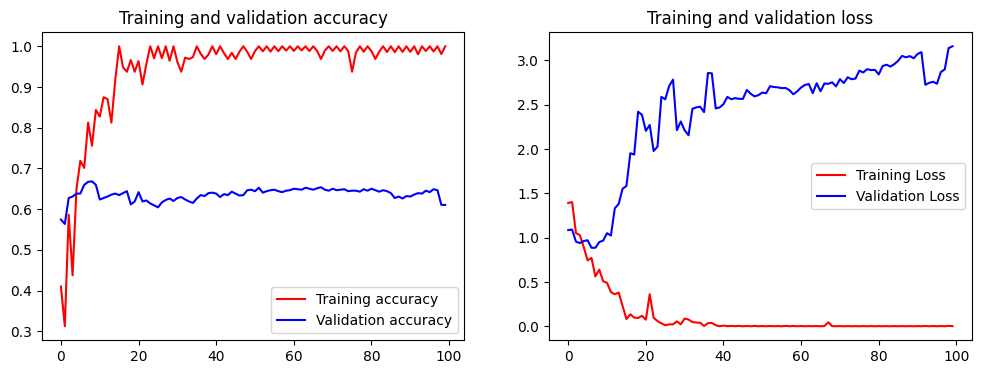

27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step

Confusion Matrix:


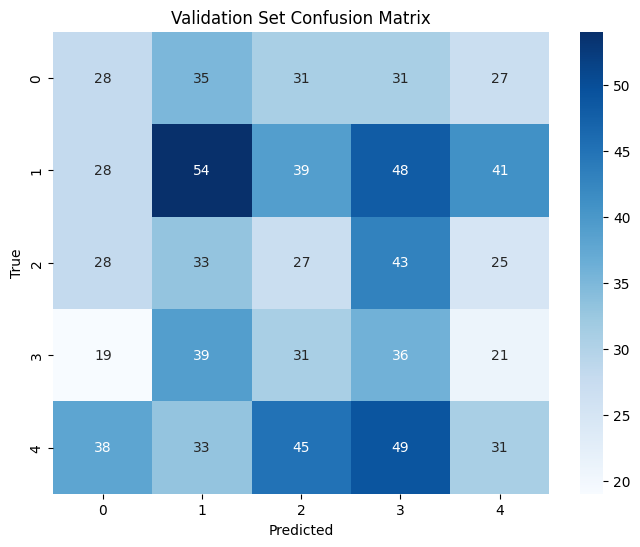


Classification Report:               precision    recall  f1-score   support

       daisy       0.20      0.18      0.19       152
   dandelion       0.28      0.26      0.27       210
        rose       0.16      0.17      0.16       156
   sunflower       0.17      0.25      0.20       146
       tulip       0.21      0.16      0.18       196

    accuracy                           0.20       860
   macro avg       0.20      0.20      0.20       860
weighted avg       0.21      0.20      0.20       860

Number of misclassified images: 684


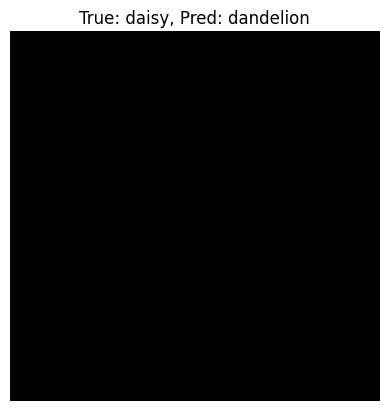

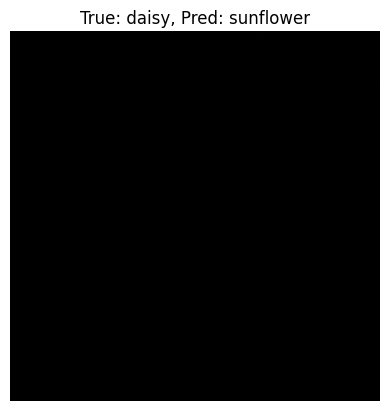

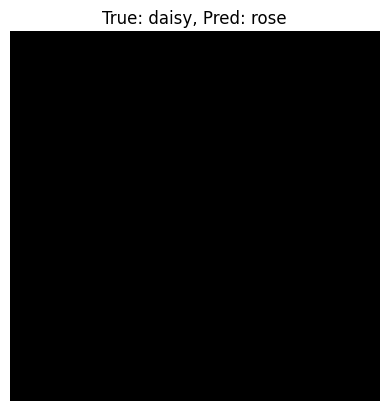

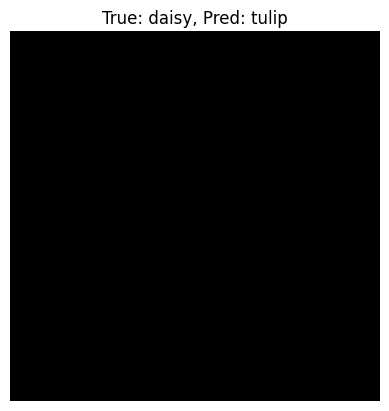

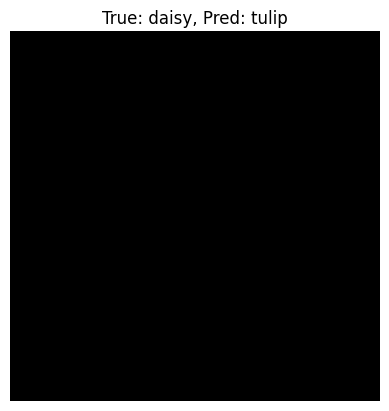


Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,043,281 (110.79 MB)

 Trainable params: 9,681,093 (36.93 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,362,188 (73.86 MB)

Total Parameters: 9681093
Trainable Parameters: 9681093
Non-trainable Parameters: 0


In [ ]:
#Step 5 implementation
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import seaborn as sns

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

# ## Write Visualisation Code Below
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(epochs, acc, 'r', label='Training accuracy')
ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'r', label='Training Loss')
ax2.plot(epochs, val_loss, 'b', label='Validation Loss')
ax2.set_title('Training and validation loss')
ax2.legend()

plt.show()


# 2. Confusion Matrix on validation set
# Get predictions on validation set
val_generator = validation_generator
val_steps = val_generator.samples // val_generator.batch_size + 1
val_preds = model.predict(val_generator, steps=val_steps)
val_pred_labels = np.argmax(val_preds, axis=1)

# True labels
val_true_labels = val_generator.classes

# Confusion matrix
cm = confusion_matrix(val_true_labels, val_pred_labels)
print("\nConfusion Matrix:")

# Visualize confusion matrix
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Validation Set Confusion Matrix")
plt.show()


# 3. Performance per flower type
class_indices = val_generator.class_indices
target_names = list(class_indices.keys())

report = classification_report(val_true_labels, val_pred_labels, target_names=target_names)
print("\nClassification Report:", report)


# 4. Identify misclassified images
misclassified_idx = np.where(val_true_labels != val_pred_labels)[0]
print(f"Number of misclassified images: {len(misclassified_idx)}")

# Display a few misclassified images
for i in misclassified_idx[:5]:
    img, label = val_generator[i // val_generator.batch_size][0][i % val_generator.batch_size], val_true_labels[i]
    plt.imshow(img.astype('uint8'))
    plt.title(f"True: {target_names[val_true_labels[i]]}, Pred: {target_names[val_pred_labels[i]]}")
    plt.axis('off')
    plt.show()

# 5. Model complexity
print("\nModel Summary:")
model.summary()  # Shows total parameters and layers

total_params = model.count_params()
trainable_params = np.sum([tf.keras.backend.count_params(p) for p in model.trainable_weights])
non_trainable_params = total_params - trainable_params

print(f"Total Parameters: {total_params}")
print(f"Trainable Parameters: {trainable_params}")
print(f"Non-trainable Parameters: {non_trainable_params}")


# 6. Check if model size may be a constraint
if total_params > 5e6:  # arbitrary threshold for large models
    print("Warning: Model is relatively large and may overfit or be slow to train on small datasets.")
else:
    print("Model size is reasonable for this dataset.")


**6. Test the model by giving it a picture taken by your own phone camera. (10 points)**

* How can the accuracy of the model on the picture taken by your own phone camera be evaluated?

* What can be done if the model does not perform well on the picture taken by your own phone camera?


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 781ms/step
Image: /content/daisies.webp
Predicted Class: daisy
Confidence: 99.93%


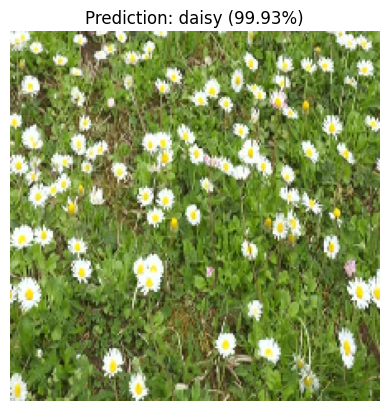

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Image: /content/tulip.jpeg
Predicted Class: tulip
Confidence: 100.00%


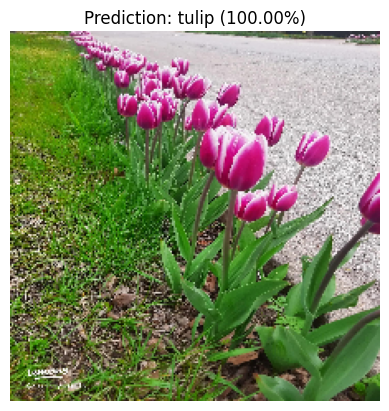

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Image: /content/dandelion.jpeg
Predicted Class: dandelion
Confidence: 99.68%


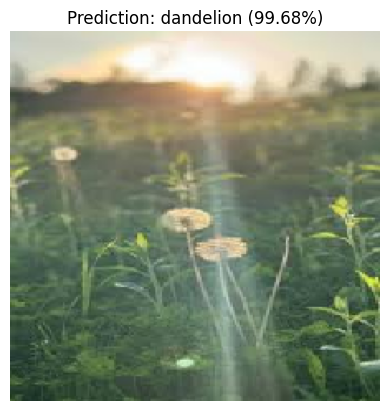

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Image: /content/rose.webp
Predicted Class: rose
Confidence: 100.00%


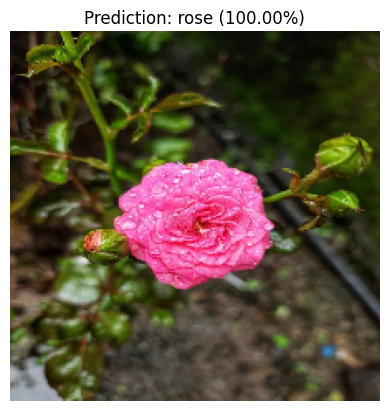

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Image: /content/rose2.jpg
Predicted Class: rose
Confidence: 99.72%


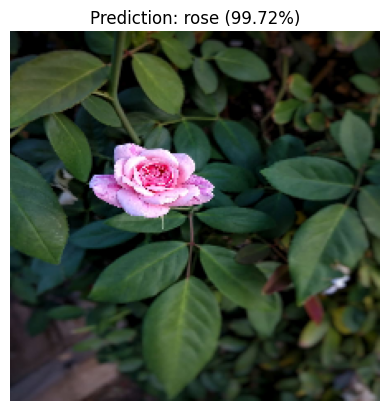

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Image: /content/sunflower.avif
Predicted Class: daisy
Confidence: 98.79%


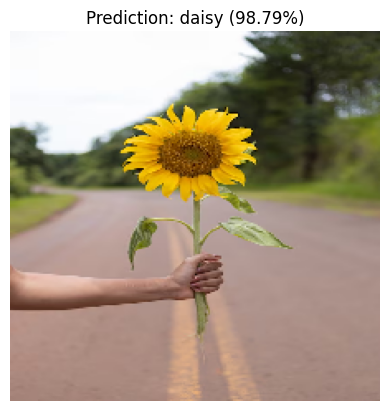

In [ ]:
from tensorflow.keras.preprocessing import image

def predict_phone_images(model, img_paths, class_names):
    """
    Predict the classes of multiple images taken by a phone.

    Args:
        model: Trained Keras model.
        img_paths: List of paths to image files.
        class_names: List of class names in the same order as training generator.

    Returns:
        None. Prints predicted class and confidence for each image, and displays the image.
    """
    for path in img_paths:
        # Load and preprocess the image
        img = image.load_img(path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0  # normalize like training

        # Make prediction
        pred = model.predict(img_array)

        # Multi-class prediction
        pred_label_index = np.argmax(pred, axis=1)[0]
        confidence = pred[0][pred_label_index]
        predicted_class = class_names[pred_label_index]

        # Show results
        print(f"Image: {path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence*100:.2f}%")

        plt.imshow(img)
        plt.title(f"Prediction: {predicted_class} ({confidence*100:.2f}%)")
        plt.axis('off')
        plt.show()


# ---------------------------
# Usage example
# ---------------------------
class_names = list(validation_generator.class_indices.keys())
img_paths = ["/content/daisies.webp", "/content/tulip.jpeg", "/content/dandelion.jpeg", "/content/rose.webp", "/content/rose2.jpg", "/content/sunflower.avif"]

predict_phone_images(model, img_paths, class_names)


**7. Use the same architecture but now train two different models one with L1 or L2 regularization, and one with batch normalization. (10 points)**


* Based on the results of the regularized and batch normalized models, how effective are L1 or L2 regularization and batch normalization techniques? How do they impact the model's performance, convergence, size, and inference time?

* How do the learned weights of the L1 or L2 regularized models compare to the baseline model? Provide any insights on the differences in the learned weights and what it implies for the model's performance and interpretability?

* What insights can be drawn from the comprehensive analysis of the regularized and batch normalized models regarding the use of regularization and normalization techniques in training machine learning models?

Found 3019 images belonging to 5 classes.
Found 860 images belonging to 5 classes.
Found 438 images belonging to 5 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 52, 52, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,682,501 (36.94 MB)

 Trainable params: 9,681,797 (36.93 MB)

 Non-trainable params: 704 (2.75 KB)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
150/150 - 58s - 384ms/step - accuracy: 0.3678 - loss: 7.4735 - val_accuracy: 0.3081 - val_loss: 2.6949
Epoch 2/100


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


150/150 - 2s - 13ms/step - accuracy: 0.5500 - loss: 1.3525 - val_accuracy: 0.3140 - val_loss: 3.0423
Epoch 3/100
150/150 - 66s - 441ms/step - accuracy: 0.4125 - loss: 1.7741 - val_accuracy: 0.2849 - val_loss: 3.0677
Epoch 4/100
150/150 - 2s - 12ms/step - accuracy: 0.3000 - loss: 1.7729 - val_accuracy: 0.2872 - val_loss: 3.1093
Epoch 5/100
150/150 - 40s - 270ms/step - accuracy: 0.4605 - loss: 1.3414 - val_accuracy: 0.5012 - val_loss: 1.2388
Epoch 6/100
150/150 - 2s - 12ms/step - accuracy: 0.6000 - loss: 1.1129 - val_accuracy: 0.4988 - val_loss: 1.2353
Epoch 7/100
150/150 - 41s - 276ms/step - accuracy: 0.4958 - loss: 1.2775 - val_accuracy: 0.5488 - val_loss: 1.1169
Epoch 8/100
150/150 - 2s - 12ms/step - accuracy: 0.4500 - loss: 1.8580 - val_accuracy: 0.5593 - val_loss: 1.1058
Epoch 9/100
150/150 - 41s - 271ms/step - accuracy: 0.5018 - loss: 1.2619 - val_accuracy: 0.5907 - val_loss: 1.0514
Epoch 10/100
150/150 - 2s - 12ms/step - accuracy: 0.4500 - loss: 1.1017 - val_accuracy: 0.6023 - val

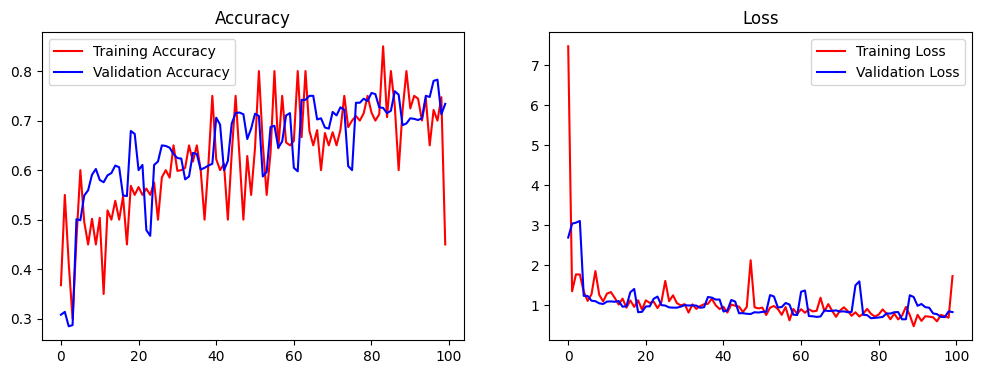

44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step


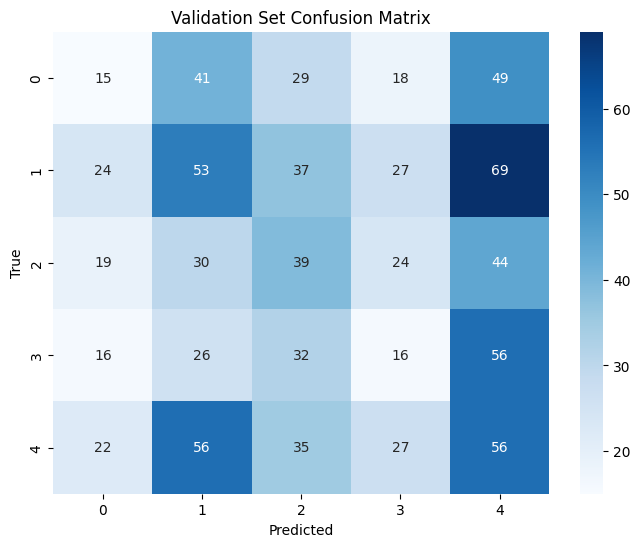


Classification Report:
               precision    recall  f1-score   support

       daisy       0.16      0.10      0.12       152
   dandelion       0.26      0.25      0.25       210
        rose       0.23      0.25      0.24       156
   sunflower       0.14      0.11      0.12       146
       tulip       0.20      0.29      0.24       196

    accuracy                           0.21       860
   macro avg       0.20      0.20      0.20       860
weighted avg       0.20      0.21      0.20       860


Total Parameters: 9682501
Trainable Parameters: 9681797
Non-trainable Parameters: 704


In [ ]:
# -----------------------------
# 1. Data Augmentation
# -----------------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),
    batch_size=20,
    class_mode='categorical'
)

validation_generator = test_datagen.flow_from_directory(
    val_dir,
    target_size=(224,224),
    batch_size=20,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    batch_size=20,
    class_mode='categorical',
    shuffle=False
)

# -----------------------------
# 2. CNN Model with BatchNorm
# -----------------------------
model_batch_normalization = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(5, activation='softmax')  # Softmax for multi-class
])

model_batch_normalization.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model_batch_normalization.summary()

# -----------------------------
# 3. Train the Model
# -----------------------------
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = validation_generator.samples // validation_generator.batch_size

batch_norm_history = model_batch_normalization.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    verbose=2
)

# -----------------------------
# 4. Visualize Training/Validation Accuracy and Loss
# -----------------------------
acc = batch_norm_history.history['accuracy']
val_acc = batch_norm_history.history['val_accuracy']
loss = batch_norm_history.history['loss']
val_loss = batch_norm_history.history['val_loss']

epochs = range(len(acc))

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(12,4))
ax1.plot(epochs, acc, 'r', label='Training Accuracy')
ax1.plot(epochs, val_acc, 'b', label='Validation Accuracy')
ax1.set_title('Accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'r', label='Training Loss')
ax2.plot(epochs, val_loss, 'b', label='Validation Loss')
ax2.set_title('Loss')
ax2.legend()
plt.show()

# -----------------------------
# 5. Confusion Matrix and Classification Report
# -----------------------------
val_steps = validation_generator.samples // validation_generator.batch_size + 1
val_preds = model_batch_normalization.predict(validation_generator, steps=val_steps)
val_pred_labels = np.argmax(val_preds, axis=1)
val_true_labels = validation_generator.classes

# Confusion matrix
cm = confusion_matrix(val_true_labels, val_pred_labels)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Validation Set Confusion Matrix")
plt.show()

# Classification report
target_names = list(validation_generator.class_indices.keys())
report = classification_report(val_true_labels, val_pred_labels, target_names=target_names)
print("\nClassification Report:\n", report)

# -----------------------------
# 6. Model Complexity
# -----------------------------
total_params = model_batch_normalization.count_params()
trainable_params = np.sum([tf.keras.backend.count_params(p) for p in model_batch_normalization.trainable_weights])
non_trainable_params = total_params - trainable_params

print(f"\nTotal Parameters: {total_params}")
print(f"Trainable Parameters: {trainable_params}")
print(f"Non-trainable Parameters: {non_trainable_params}")

if total_params > 5e6:
    print("Warning: Model is relatively large and may overfit or be slow on small datasets.")
else:
    print("Model size is reasonable for this dataset.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step
Image: /content/daisies.webp
Predicted Class: daisy
Confidence: 39.10%


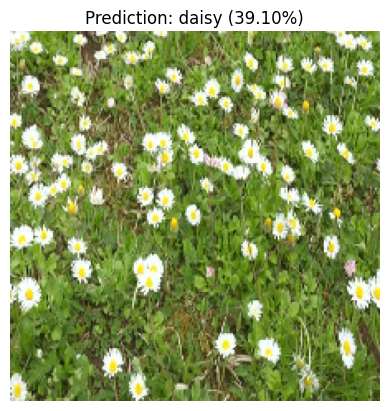

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Image: /content/tulip.jpeg
Predicted Class: tulip
Confidence: 98.85%


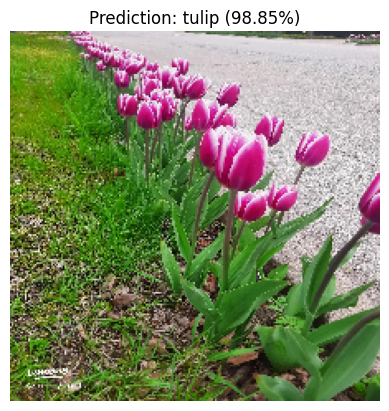

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Image: /content/dandelion.jpeg
Predicted Class: rose
Confidence: 36.56%


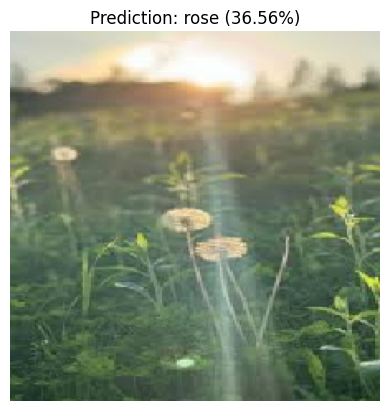

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Image: /content/rose.webp
Predicted Class: rose
Confidence: 87.38%


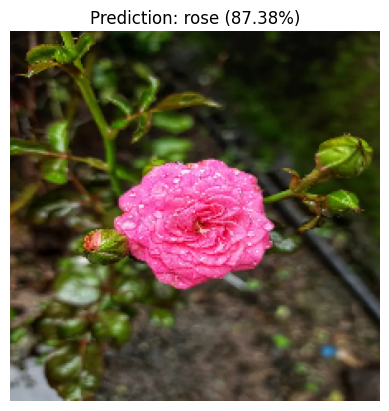

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Image: /content/rose2.jpg
Predicted Class: rose
Confidence: 89.12%


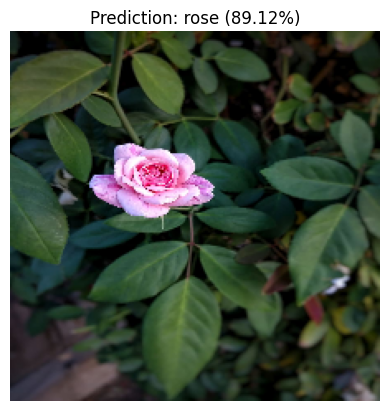

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Image: /content/sunflower.avif
Predicted Class: sunflower
Confidence: 46.28%


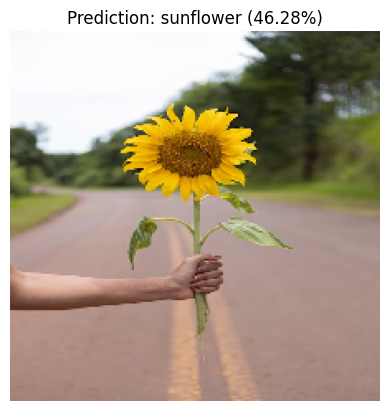

In [ ]:
from tensorflow.keras.preprocessing import image

def predict_phone_images(model, img_paths, class_names):
    """
    Predict the classes of multiple images taken by a phone.

    Args:
        model: Trained Keras model.
        img_paths: List of paths to image files.
        class_names: List of class names in the same order as training generator.

    Returns:
        None. Prints predicted class and confidence for each image, and displays the image.
    """
    for path in img_paths:
        # Load and preprocess the image
        img = image.load_img(path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0  # normalize like training

        # Make prediction
        pred = model_batch_normalization.predict(img_array)

        # Multi-class prediction
        pred_label_index = np.argmax(pred, axis=1)[0]
        confidence = pred[0][pred_label_index]
        predicted_class = class_names[pred_label_index]

        # Show results
        print(f"Image: {path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence*100:.2f}%")

        plt.imshow(img)
        plt.title(f"Prediction: {predicted_class} ({confidence*100:.2f}%)")
        plt.axis('off')
        plt.show()


# ---------------------------
# Usage example
# ---------------------------
class_names = list(validation_generator.class_indices.keys())
img_paths = ["/content/daisies.webp", "/content/tulip.jpeg", "/content/dandelion.jpeg", "/content/rose.webp", "/content/rose2.jpg", "/content/sunflower.avif"]

predict_phone_images(model, img_paths, class_names)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,681,093 (36.93 MB)

 Trainable params: 9,681,093 (36.93 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
150/150 - 50s - 331ms/step - accuracy: 0.4151 - loss: 1.6884 - val_accuracy: 0.4233 - val_loss: 1.5385
Epoch 2/100


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


150/150 - 2s - 13ms/step - accuracy: 0.5500 - loss: 1.4233 - val_accuracy: 0.4151 - val_loss: 1.5663
Epoch 3/100
150/150 - 42s - 277ms/step - accuracy: 0.4912 - loss: 1.3383 - val_accuracy: 0.5663 - val_loss: 1.2238
Epoch 4/100
150/150 - 2s - 12ms/step - accuracy: 0.4000 - loss: 1.2831 - val_accuracy: 0.5430 - val_loss: 1.2519
Epoch 5/100
150/150 - 41s - 271ms/step - accuracy: 0.5372 - loss: 1.2538 - val_accuracy: 0.5930 - val_loss: 1.2070
Epoch 6/100
150/150 - 2s - 13ms/step - accuracy: 0.6000 - loss: 1.3144 - val_accuracy: 0.5698 - val_loss: 1.2336
Epoch 7/100
150/150 - 41s - 275ms/step - accuracy: 0.5322 - loss: 1.2456 - val_accuracy: 0.6081 - val_loss: 1.1792
Epoch 8/100
150/150 - 2s - 12ms/step - accuracy: 0.3500 - loss: 1.3698 - val_accuracy: 0.6058 - val_loss: 1.1834
Epoch 9/100
150/150 - 40s - 269ms/step - accuracy: 0.5862 - loss: 1.1806 - val_accuracy: 0.6581 - val_loss: 1.0647
Epoch 10/100
150/150 - 2s - 12ms/step - accuracy: 0.6500 - loss: 0.9999 - val_accuracy: 0.6465 - val

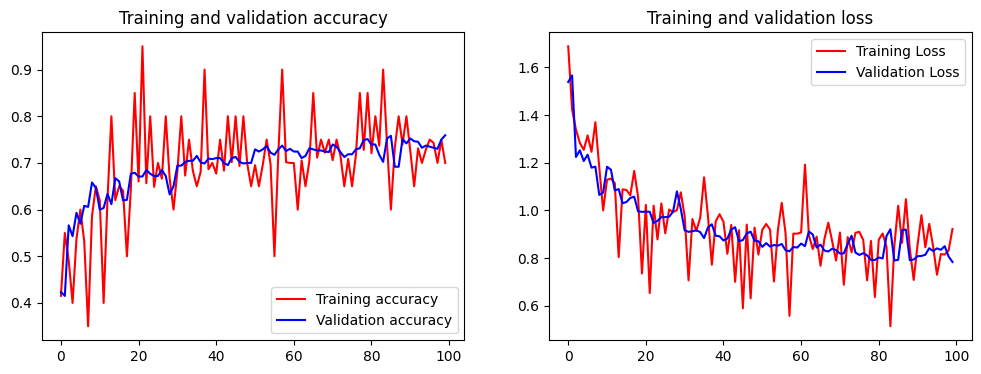

44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step


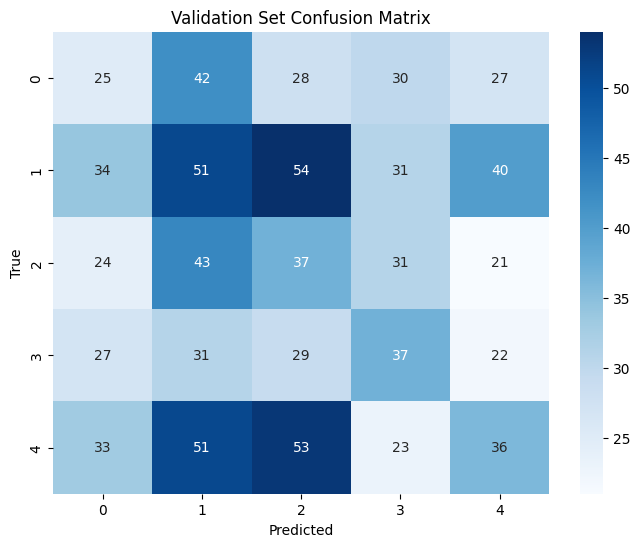


Classification Report:
               precision    recall  f1-score   support

       daisy       0.17      0.16      0.17       152
   dandelion       0.23      0.24      0.24       210
        rose       0.18      0.24      0.21       156
   sunflower       0.24      0.25      0.25       146
       tulip       0.25      0.18      0.21       196

    accuracy                           0.22       860
   macro avg       0.22      0.22      0.21       860
weighted avg       0.22      0.22      0.22       860


Total Parameters: 9681093
Trainable Parameters: 9681093
Non-trainable Parameters: 0


In [ ]:
# -----------------------------
# L2 Regularization CNN Model
# -----------------------------

# L2 regularization factor
l2_factor = 0.001

model_l2 = Sequential([
    Conv2D(32, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_factor), input_shape=(224, 224, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_factor)),
    MaxPooling2D(2,2),
    Conv2D(128, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_factor)),
    MaxPooling2D(2,2),
    Conv2D(128, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_factor)),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(512, activation='relu', kernel_regularizer=regularizers.l2(l2_factor)),
    Dropout(0.5),
    Dense(5, activation='softmax')  # Softmax for multi-class
])

model_l2.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model_l2.summary()

# -----------------------------
# Train the model
# -----------------------------
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = validation_generator.samples // validation_generator.batch_size

l2_history = model_l2.fit(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=validation_steps,
      verbose=2
)

# -----------------------------
# Plot Accuracy and Loss
# -----------------------------
acc = l2_history.history['accuracy']
val_acc = l2_history.history['val_accuracy']
loss = l2_history.history['loss']
val_loss = l2_history.history['val_loss']

epochs = range(len(acc))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(epochs, acc, 'r', label='Training accuracy')
ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'r', label='Training Loss')
ax2.plot(epochs, val_loss, 'b', label='Validation Loss')
ax2.set_title('Training and validation loss')
ax2.legend()
plt.show()

# -----------------------------
# Confusion Matrix & Classification Report
# -----------------------------
val_steps = validation_generator.samples // validation_generator.batch_size + 1
val_preds = model_l2.predict(validation_generator, steps=val_steps)
val_pred_labels = np.argmax(val_preds, axis=1)
val_true_labels = validation_generator.classes

cm = confusion_matrix(val_true_labels, val_pred_labels)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Validation Set Confusion Matrix")
plt.show()

target_names = list(validation_generator.class_indices.keys())
report = classification_report(val_true_labels, val_pred_labels, target_names=target_names)
print("\nClassification Report:\n", report)

# -----------------------------
# Model Complexity
# -----------------------------
total_params = model_l2.count_params()
trainable_params = np.sum([tf.keras.backend.count_params(p) for p in model_l2.trainable_weights])
non_trainable_params = total_params - trainable_params

print(f"\nTotal Parameters: {total_params}")
print(f"Trainable Parameters: {trainable_params}")
print(f"Non-trainable Parameters: {non_trainable_params}")

if total_params > 5e6:
    print("Warning: Model is relatively large and may overfit or be slow to train on small datasets.")
else:
    print("Model size is reasonable for this dataset.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
Image: /content/daisies.webp
Predicted Class: daisy
Confidence: 91.07%


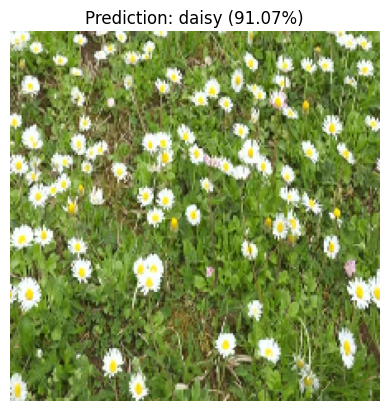

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Image: /content/tulip.jpeg
Predicted Class: tulip
Confidence: 78.79%


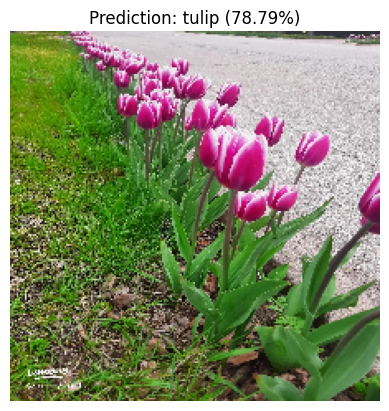

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Image: /content/dandelion.jpeg
Predicted Class: dandelion
Confidence: 79.86%


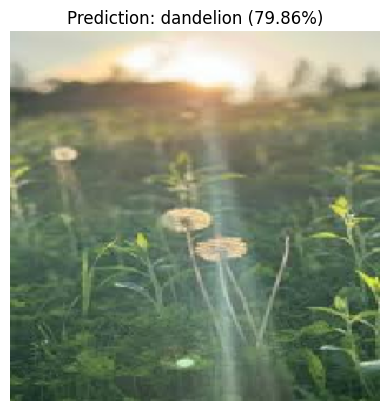

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Image: /content/rose.webp
Predicted Class: rose
Confidence: 77.86%


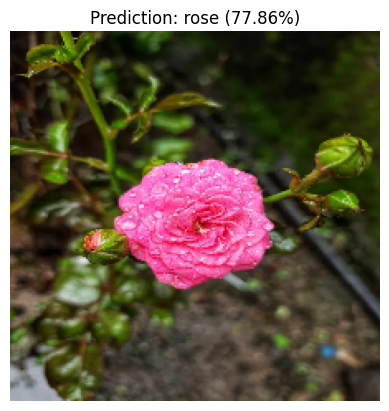

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Image: /content/rose2.jpg
Predicted Class: rose
Confidence: 62.98%


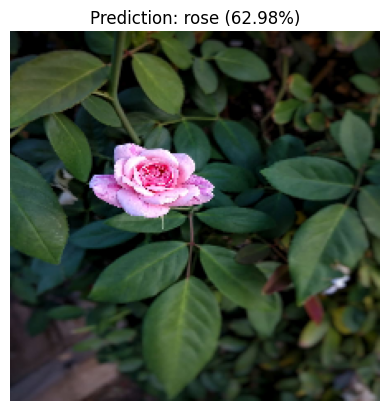

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Image: /content/sunflower.avif
Predicted Class: sunflower
Confidence: 55.16%


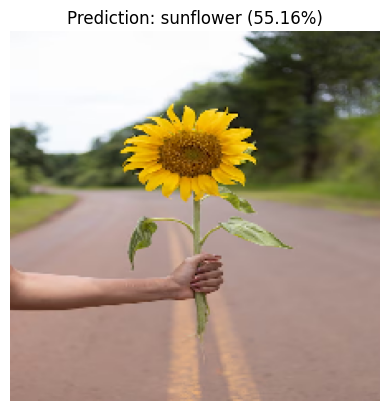

In [ ]:
from tensorflow.keras.preprocessing import image

def predict_phone_images(model, img_paths, class_names):
    """
    Predict the classes of multiple images taken by a phone.

    Args:
        model: Trained Keras model.
        img_paths: List of paths to image files.
        class_names: List of class names in the same order as training generator.

    Returns:
        None. Prints predicted class and confidence for each image, and displays the image.
    """
    for path in img_paths:
        # Load and preprocess the image
        img = image.load_img(path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0  # normalize like training

        # Make prediction
        pred = model_l2.predict(img_array)

        # Multi-class prediction
        pred_label_index = np.argmax(pred, axis=1)[0]
        confidence = pred[0][pred_label_index]
        predicted_class = class_names[pred_label_index]

        # Show results
        print(f"Image: {path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence*100:.2f}%")

        plt.imshow(img)
        plt.title(f"Prediction: {predicted_class} ({confidence*100:.2f}%)")
        plt.axis('off')
        plt.show()


class_names = list(validation_generator.class_indices.keys())
img_paths = ["/content/daisies.webp", "/content/tulip.jpeg", "/content/dandelion.jpeg", "/content/rose.webp", "/content/rose2.jpg", "/content/sunflower.avif"]

predict_phone_images(model, img_paths, class_names)


**8. Improve the accuracy by trying something extra. (10 points)**

* By incorporating additional training strategies such as regularization techniques like dropout, data augmentation, and batch or layer normalization, can the accuracy of the model be improved?

* Modify the given model architecture to improve the accuracy over the baseline? You can modify the model architecture by adding or removing layers, changing the number of filters, or adding skip connections.


* Use transfer learning to fine-tune an existing pre-trained model to improve accuracy?  What approach will you use for transfer learning: feature extraction or fine-tuning and why?



Found 3019 images belonging to 5 classes.
Found 860 images belonging to 5 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 109, 109, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 52, 52, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,682,501 (36.94 MB)

 Trainable params: 9,681,797 (36.93 MB)

 Non-trainable params: 704 (2.75 KB)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
94/94 - 52s - 554ms/step - accuracy: 0.4074 - loss: 7.1453 - val_accuracy: 0.2536 - val_loss: 4.3896
Epoch 2/100


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


94/94 - 2s - 24ms/step - accuracy: 0.5000 - loss: 3.9748 - val_accuracy: 0.2512 - val_loss: 4.2282
Epoch 3/100
94/94 - 40s - 424ms/step - accuracy: 0.4165 - loss: 3.5641 - val_accuracy: 0.2536 - val_loss: 4.6079
Epoch 4/100
94/94 - 2s - 19ms/step - accuracy: 0.3750 - loss: 2.8796 - val_accuracy: 0.2500 - val_loss: 4.5949
Epoch 5/100
94/94 - 41s - 437ms/step - accuracy: 0.4526 - loss: 2.9907 - val_accuracy: 0.2668 - val_loss: 3.8611
Epoch 6/100
94/94 - 2s - 25ms/step - accuracy: 0.3750 - loss: 2.8042 - val_accuracy: 0.2704 - val_loss: 3.7485
Epoch 7/100
94/94 - 40s - 424ms/step - accuracy: 0.4744 - loss: 2.9273 - val_accuracy: 0.2933 - val_loss: 3.8031
Epoch 8/100
94/94 - 2s - 20ms/step - accuracy: 0.5938 - loss: 2.7890 - val_accuracy: 0.2945 - val_loss: 3.9066
Epoch 9/100
94/94 - 40s - 425ms/step - accuracy: 0.5109 - loss: 2.6751 - val_accuracy: 0.4387 - val_loss: 2.7042
Epoch 10/100
94/94 - 2s - 18ms/step - accuracy: 0.4062 - loss: 2.5819 - val_accuracy: 0.4471 - val_loss: 2.6964
Epoc

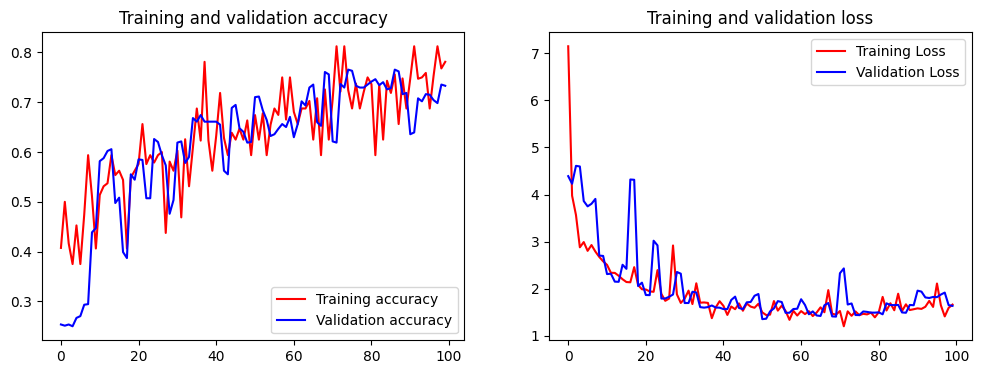

In [ ]:
#Step 8 implementation
# -----------------------------
# 1. Data Augmentation
# -----------------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
)

validation_generator = test_datagen.flow_from_directory(
    val_dir,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
)

# -----------------------------
# 2. Improved CNN Model
# -----------------------------
l2_factor = 0.001

improved_model = Sequential([
    Conv2D(32, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_factor), input_shape=(224,224,3)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_factor)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_factor)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_factor)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(512, activation='relu', kernel_regularizer=regularizers.l2(l2_factor)),
    Dropout(0.5),
    Dense(5, activation='softmax')
])

improved_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

improved_model.summary()

# -----------------------------
# 3. Train the Model
# -----------------------------
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = validation_generator.samples // validation_generator.batch_size

history_improved = improved_model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    verbose=2
)

# -----------------------------
# 4. Plot Accuracy and Loss
# -----------------------------
acc = history_improved.history['accuracy']
val_acc = history_improved.history['val_accuracy']
loss = history_improved.history['loss']
val_loss = history_improved.history['val_loss']

epochs = range(len(acc))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(epochs, acc, 'r', label='Training accuracy')
ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'r', label='Training Loss')
ax2.plot(epochs, val_loss, 'b', label='Validation Loss')
ax2.set_title('Training and validation loss')
ax2.legend()

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step
Image: /content/daisies.webp
Predicted Class: daisy
Confidence: 47.36%


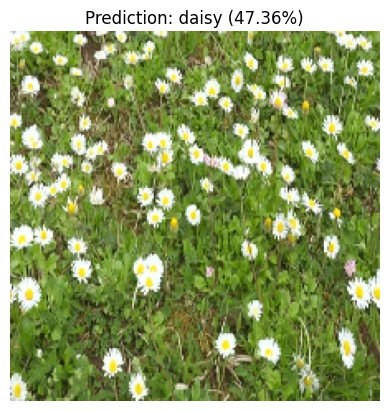

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Image: /content/tulip.jpeg
Predicted Class: tulip
Confidence: 56.48%


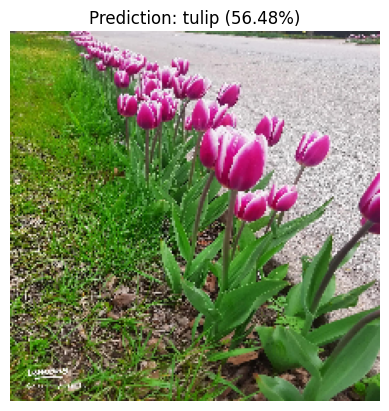

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Image: /content/dandelion.jpeg
Predicted Class: dandelion
Confidence: 61.89%


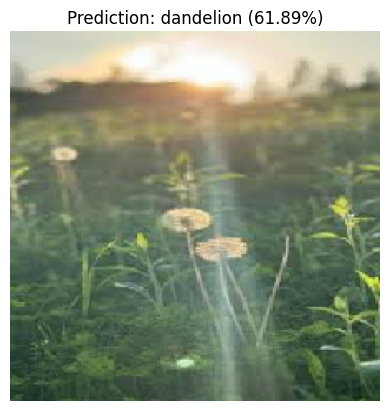

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Image: /content/rose.webp
Predicted Class: rose
Confidence: 97.88%


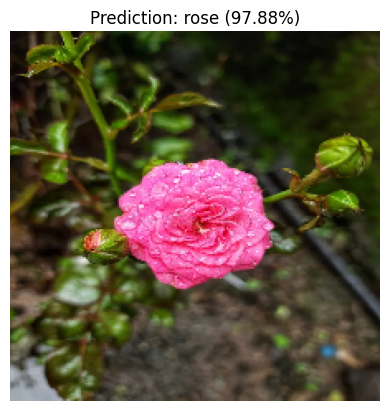

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Image: /content/rose2.jpg
Predicted Class: rose
Confidence: 82.16%


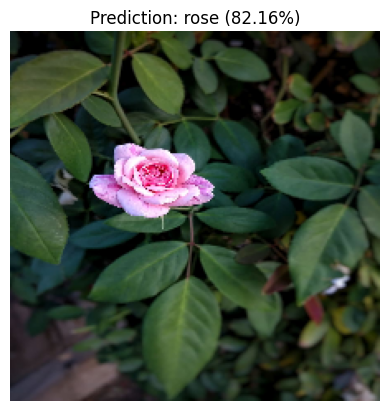

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Image: /content/sunflower.avif
Predicted Class: sunflower
Confidence: 51.02%


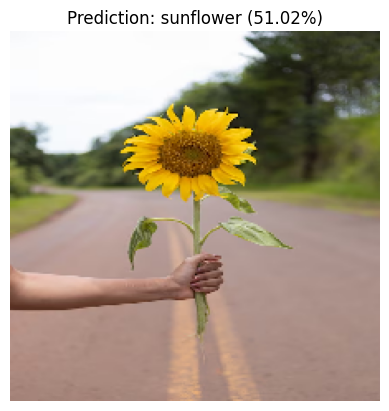

In [ ]:
from tensorflow.keras.preprocessing import image

def predict_phone_images(model, img_paths, class_names):
    """
    Predict the classes of multiple images taken by a phone.

    Args:
        model: Trained Keras model.
        img_paths: List of paths to image files.
        class_names: List of class names in the same order as training generator.

    Returns:
        None. Prints predicted class and confidence for each image, and displays the image.
    """
    for path in img_paths:
        # Load and preprocess the image
        img = image.load_img(path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0  # normalize like training

        # Make prediction
        pred = improved_model.predict(img_array)

        # Multi-class prediction
        pred_label_index = np.argmax(pred, axis=1)[0]
        confidence = pred[0][pred_label_index]
        predicted_class = class_names[pred_label_index]

        # Show results
        print(f"Image: {path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence*100:.2f}%")

        plt.imshow(img)
        plt.title(f"Prediction: {predicted_class} ({confidence*100:.2f}%)")
        plt.axis('off')
        plt.show()


# ---------------------------
# Usage example
# ---------------------------
class_names = list(validation_generator.class_indices.keys())
img_paths = ["/content/daisies.webp", "/content/tulip.jpeg", "/content/dandelion.jpeg", "/content/rose.webp", "/content/rose2.jpg", "/content/sunflower.avif"]

predict_phone_images(model, img_paths, class_names)


FINE-TUNING TRANSFER LEARNING MODEL
Total layers in VGG16: 19
Trainable layers: 4

Total parameters: 15,112,005
Trainable parameters: 7,475,717

Training fine-tuning model...
Epoch 1/50
94/94 - 60s - 640ms/step - accuracy: 0.6013 - loss: 1.8818 - val_accuracy: 0.7175 - val_loss: 1.7506 - learning_rate: 1.0000e-04
Epoch 2/50


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


94/94 - 5s - 54ms/step - accuracy: 0.6562 - loss: 1.7538 - val_accuracy: 0.7188 - val_loss: 1.7421 - learning_rate: 1.0000e-04
Epoch 3/50
94/94 - 82s - 867ms/step - accuracy: 0.7683 - loss: 1.4133 - val_accuracy: 0.7969 - val_loss: 1.3464 - learning_rate: 1.0000e-04
Epoch 4/50
94/94 - 5s - 50ms/step - accuracy: 0.6562 - loss: 1.4096 - val_accuracy: 0.7981 - val_loss: 1.3368 - learning_rate: 1.0000e-04
Epoch 5/50
94/94 - 49s - 516ms/step - accuracy: 0.8135 - loss: 1.2446 - val_accuracy: 0.8582 - val_loss: 1.1178 - learning_rate: 1.0000e-04
Epoch 6/50
94/94 - 5s - 49ms/step - accuracy: 0.9062 - loss: 1.0730 - val_accuracy: 0.8570 - val_loss: 1.1259 - learning_rate: 1.0000e-04
Epoch 7/50
94/94 - 49s - 523ms/step - accuracy: 0.8363 - loss: 1.1440 - val_accuracy: 0.8546 - val_loss: 1.0566 - learning_rate: 1.0000e-04
Epoch 8/50
94/94 - 5s - 50ms/step - accuracy: 0.8438 - loss: 1.1839 - val_accuracy: 0.8594 - val_loss: 1.0487 - learning_rate: 1.0000e-04
Epoch 9/50
94/94 - 82s - 871ms/step - a

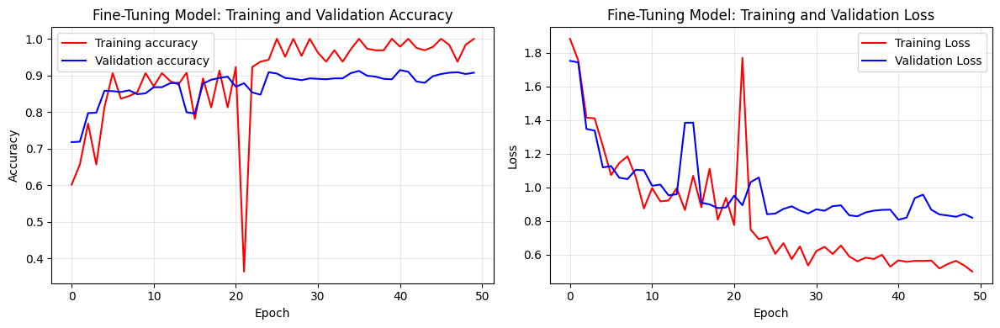


Saving fine-tuning model...
Model saved successfully!


In [ ]:
# Using fine tuning since it leads to better performance and adaptations to flower-specific features

import pandas as pd
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import GlobalAveragePooling2D


# -----------------------------
# Fine-Tuning Model (VGG16)
# -----------------------------
print("=" * 70)
print("FINE-TUNING TRANSFER LEARNING MODEL")
print("=" * 70)

# Load pre-trained VGG16
base_model = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# Freeze early layers, unfreeze last 4 convolutional blocks
base_model.trainable = True
fine_tune_at = len(base_model.layers) - 4

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

print(f"Total layers in VGG16: {len(base_model.layers)}")
print(f"Trainable layers: {sum([layer.trainable for layer in base_model.layers])}")
print()

# Build fine-tuning model
fine_tuning_model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.3),
    Dense(5, activation='softmax')
])

# Compile with lower learning rate for fine-tuning
fine_tuning_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(f"Total parameters: {fine_tuning_model.count_params():,}")
trainable_params = sum([tf.size(w).numpy() for w in fine_tuning_model.trainable_weights])
print(f"Trainable parameters: {trainable_params:,}")
print()

# Callbacks
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-8,
    verbose=1
)

# Train the fine-tuning model
print("Training fine-tuning model...")
history_ft = fine_tuning_model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=50,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    callbacks=[early_stop, reduce_lr],
    verbose=2
)


# -----------------------------
# Evaluate Initial Model
# -----------------------------
print("\n" + "=" * 70)
print("EVALUATING INITIAL MODEL")
print("=" * 70)

# Get predictions from initial model (assuming it's already trained)
print("Getting predictions from initial model...")
validation_generator.reset()
y_pred_initial = improved_model.predict(validation_generator, steps=validation_steps, verbose=1)
y_pred_initial_classes = np.argmax(y_pred_initial, axis=1)

# Get true labels
y_true = validation_generator.classes[:len(y_pred_initial_classes)]

print("\nInitial Model - Classification Report:")
print("-" * 70)
print(classification_report(
    y_true,
    y_pred_initial_classes,
    target_names=class_names,
    digits=4
))


# -----------------------------
# Evaluate Fine-Tuning Model
# -----------------------------
print("=" * 70)
print("EVALUATING FINE-TUNING MODEL")
print("=" * 70)

# Get predictions from fine-tuning model
print("Getting predictions from fine-tuning model...")
validation_generator.reset()
y_pred_ft = fine_tuning_model.predict(validation_generator, steps=validation_steps, verbose=1)
y_pred_ft_classes = np.argmax(y_pred_ft, axis=1)

print("\nFine-Tuning Model - Classification Report:")
print("-" * 70)
print(classification_report(
    y_true,
    y_pred_ft_classes,
    target_names=class_names,
    digits=4
))


# -----------------------------
# Training History Summary
# -----------------------------
print("\n" + "=" * 70)
print("TRAINING SUMMARY")
print("=" * 70)

training_summary = {
    'Model': ['Initial CNN', 'Fine-Tuning (VGG16)'],
    'Epochs Trained': [
        len(history_improved.history['accuracy']),
        len(history_ft.history['accuracy'])
    ],
    'Best Val Accuracy': [
        f"{max(history_improved.history['val_accuracy']):.4f}",
        f"{max(history_ft.history['val_accuracy']):.4f}"
    ],
    'Best Val Loss': [
        f"{min(history_improved.history['val_loss']):.4f}",
        f"{min(history_ft.history['val_loss']):.4f}"
    ],
    'Final Val Accuracy': [
        f"{history_improved.history['val_accuracy'][-1]:.4f}",
        f"{history_ft.history['val_accuracy'][-1]:.4f}"
    ],
    'Trainable Params': [
        '~5M (all)',
        f'{trainable_params:,}'
    ]
}

training_df = pd.DataFrame(training_summary)
print(training_df.to_string(index=False))


# -----------------------------
# Confusion Matrices
# -----------------------------
print("\n" + "=" * 70)
print("CONFUSION MATRICES")
print("=" * 70)

print("\nInitial Model Confusion Matrix:")
cm_initial = confusion_matrix(y_true, y_pred_initial_classes)
cm_initial_df = pd.DataFrame(cm_initial, index=class_names, columns=class_names)
print(cm_initial_df)

print("\nFine-Tuning Model Confusion Matrix:")
cm_ft = confusion_matrix(y_true, y_pred_ft_classes)
cm_ft_df = pd.DataFrame(cm_ft, index=class_names, columns=class_names)
print(cm_ft_df)

per_class_df = pd.DataFrame(per_class_data)
print(per_class_df.to_string(index=False))


# -----------------------------
# Plot Fine-Tuning Model Accuracy and Loss
# -----------------------------
print("\n" + "=" * 70)
print("FINE-TUNING MODEL TRAINING CURVES")
print("=" * 70)

acc = history_ft.history['accuracy']
val_acc = history_ft.history['val_accuracy']
loss = history_ft.history['loss']
val_loss = history_ft.history['val_loss']

epochs = range(len(acc))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(epochs, acc, 'r', label='Training accuracy')
ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
ax1.set_title('Fine-Tuning Model: Training and Validation Accuracy')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(epochs, loss, 'r', label='Training Loss')
ax2.plot(epochs, val_loss, 'b', label='Validation Loss')
ax2.set_title('Fine-Tuning Model: Training and Validation Loss')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Save model
print("\n" + "=" * 70)
print("Saving fine-tuning model...")
fine_tuning_model.save('fine_tuning_model.h5')
print("Model saved successfully!")
print("=" * 70)

In [ ]:
# del history_ft

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Image: /content/daisies.webp
Predicted Class: daisy
Confidence: 100.00%


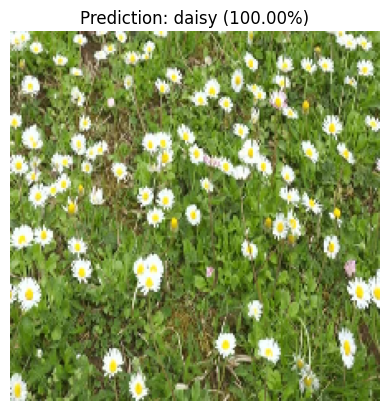

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Image: /content/tulip.jpeg
Predicted Class: tulip
Confidence: 100.00%


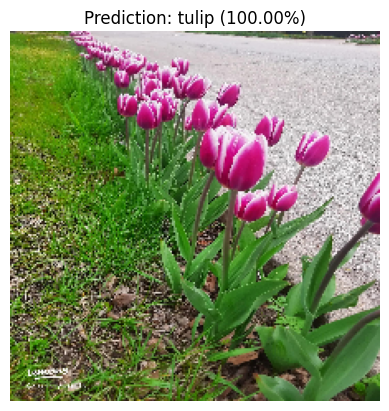

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Image: /content/dandelion.jpeg
Predicted Class: dandelion
Confidence: 99.69%


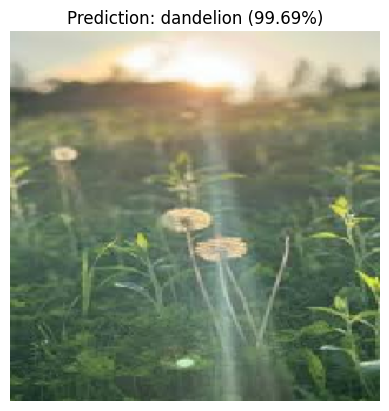

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Image: /content/rose.webp
Predicted Class: rose
Confidence: 100.00%


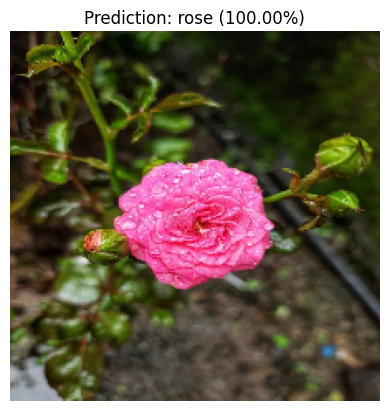

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Image: /content/rose2.jpg
Predicted Class: rose
Confidence: 99.64%


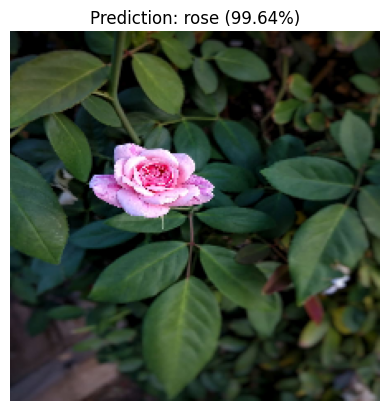

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Image: /content/sunflower.avif
Predicted Class: sunflower
Confidence: 99.50%


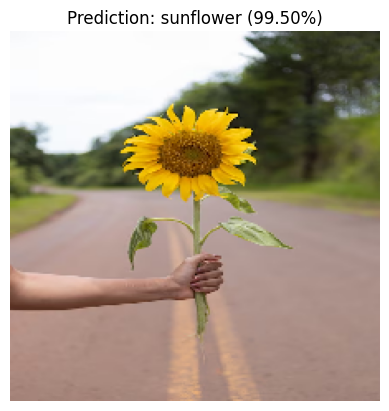

In [ ]:
from tensorflow.keras.preprocessing import image

def predict_phone_images(model, img_paths, class_names):
    """
    Predict the classes of multiple images taken by a phone.

    Args:
        model: Trained Keras model.
        img_paths: List of paths to image files.
        class_names: List of class names in the same order as training generator.

    Returns:
        None. Prints predicted class and confidence for each image, and displays the image.
    """
    for path in img_paths:
        # Load and preprocess the image
        img = image.load_img(path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0  # normalize like training

        # Make prediction
        pred = fine_tuning_model.predict(img_array)

        # Multi-class prediction
        pred_label_index = np.argmax(pred, axis=1)[0]
        confidence = pred[0][pred_label_index]
        predicted_class = class_names[pred_label_index]

        # Show results
        print(f"Image: {path}")
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence*100:.2f}%")

        plt.imshow(img)
        plt.title(f"Prediction: {predicted_class} ({confidence*100:.2f}%)")
        plt.axis('off')
        plt.show()


# ---------------------------
# Usage example
# ---------------------------
class_names = list(validation_generator.class_indices.keys())
img_paths = ["/content/daisies.webp", "/content/tulip.jpeg", "/content/dandelion.jpeg", "/content/rose.webp", "/content/rose2.jpg", "/content/sunflower.avif"]

predict_phone_images(model, img_paths, class_names)
